# 1. show dicom file as image

In [78]:
import pydicom as dicom
import matplotlib.pyplot as plt
import numpy as np
import os

# specify your image path
image_path = os.path.join('media', 'Mapa de dosis-.dcm.dcm')
ds = dicom.dcmread(image_path)

In [79]:
for key, value in ds.__dict__.items():
    print(f"{key}: {value}")
print()
print(ds)

_parent_encoding: iso8859
_dict: {(0008, 0023): RawDataElement(tag=(0008, 0023), VR=None, length=8, value=b'20250121', value_tell=288, is_implicit_VR=True, is_little_endian=True, is_raw=True), (0008, 0033): RawDataElement(tag=(0008, 0033), VR=None, length=14, value=b'231813.262887 ', value_tell=304, is_implicit_VR=True, is_little_endian=True, is_raw=True), (0010, 0010): RawDataElement(tag=(0010, 0010), VR=None, length=22, value=b'PeliculasRadicromicas ', value_tell=326, is_implicit_VR=True, is_little_endian=True, is_raw=True), (0010, 0020): RawDataElement(tag=(0010, 0020), VR=None, length=2, value=b'57', value_tell=356, is_implicit_VR=True, is_little_endian=True, is_raw=True), (0010, 2110): RawDataElement(tag=(0010, 2110), VR=None, length=18, value=b'A la ensalada roja', value_tell=366, is_implicit_VR=True, is_little_endian=True, is_raw=True), (0028, 0002): RawDataElement(tag=(0028, 0002), VR=None, length=2, value=b'\x01\x00', value_tell=392, is_implicit_VR=True, is_little_endian=True,

In [80]:
ds.pixel_array.shape

(803, 1003)

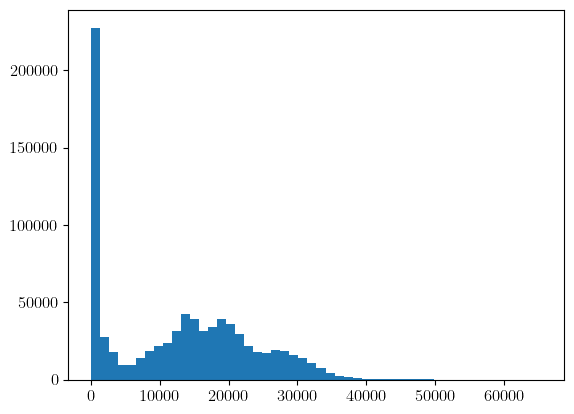

In [81]:
plt.hist(ds.pixel_array.flatten(), bins=50)
plt.show()

In [82]:
print(ds.pixel_array.min(), ds.pixel_array.max())

0 65535


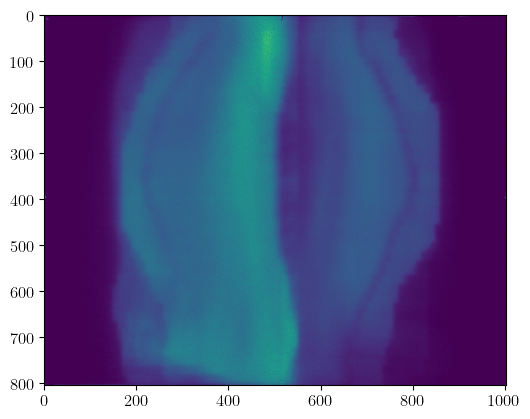

In [83]:
plt.imshow(ds.pixel_array)

In [84]:
# normalize ds
normalized_ds = (ds.pixel_array - ds.pixel_array.min()) / (ds.pixel_array.max() - ds.pixel_array.min())

In [85]:
normalized_ds.min(), normalized_ds.max()

(np.float64(0.0), np.float64(1.0))

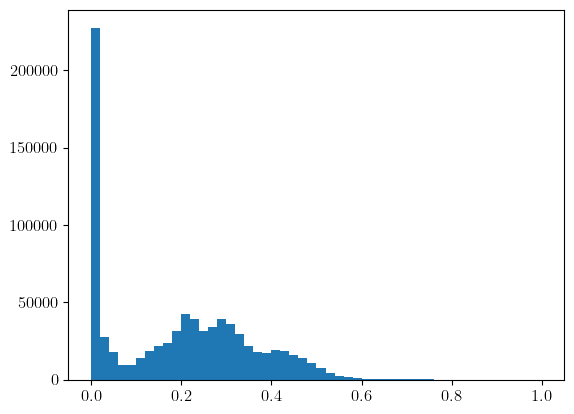

In [86]:
# histogram of the normalized ds
plt.hist(normalized_ds.flatten(), bins=50)
plt.show()

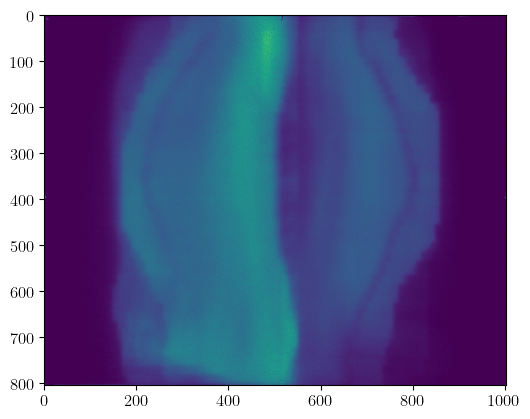

In [87]:
plt.imshow(ds.pixel_array)

# 2. Check Juliana's files

RD.1.2.246.352.71.7.593947511628.1456448.20220726133208.dcm
(256, 256)
25417663518


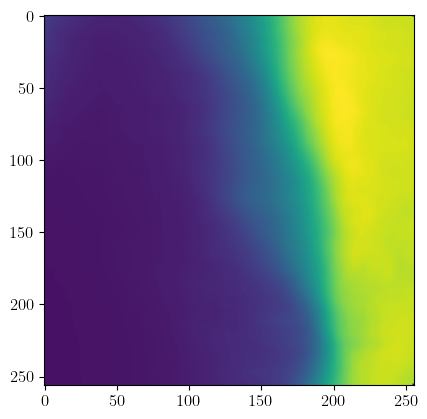

RD.1.2.246.352.71.7.593947511628.1456468.20220726133312.dcm
(256, 256)
28306546530


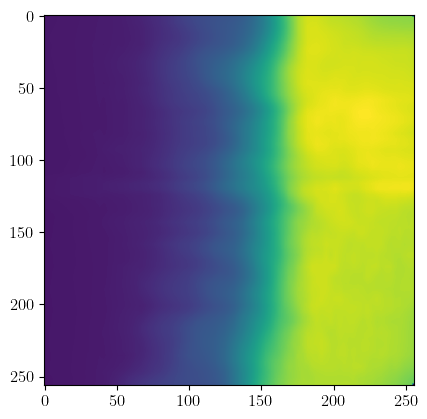

RD.1.2.246.352.71.7.593947511628.1456478.20220726133410.dcm
(256, 256)
53609105271


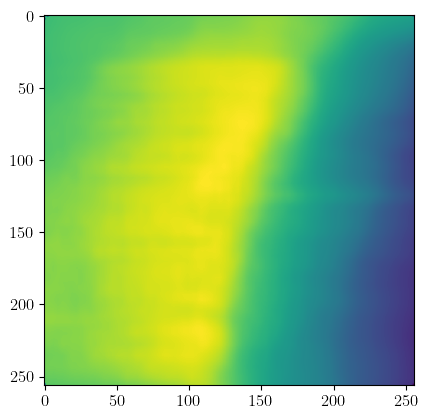

RD.1.2.246.352.71.7.593947511628.1456488.20220726133500.dcm
(256, 256)
23229949538


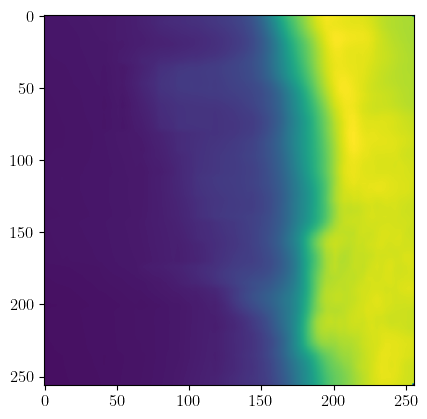

In [88]:
import pydicom as dicom
import matplotlib.pyplot as plt
import os

# specify your image path
folder_path = os.path.join('media', 'Juliana')

# go through all the dicom files in the folder
for filenameDCM in os.listdir(folder_path):

    print(filenameDCM)

    ds = dicom.dcmread(os.path.join(folder_path, filenameDCM))

    # search the positions in the matrix where the pixel value es 2147483647     
    #print(ds.pixel_array == 2147483647)
    # send those values to 0
    ds.pixel_array[ds.pixel_array == 2147483647] = 0
    print(ds.pixel_array.shape)
    print(np.sum(ds.pixel_array))
    plt.imshow(ds.pixel_array)
    plt.show()


RD.1.2.246.352.71.7.593947511628.1456448.20220726133208.dcm
(256, 256)
25419990570


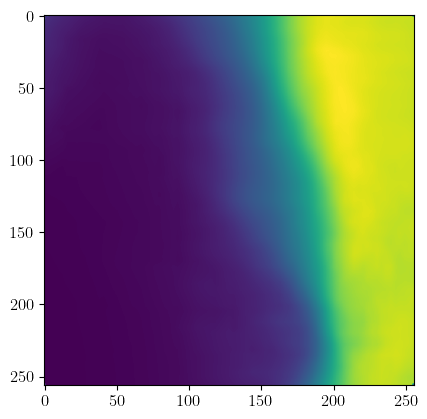

RD.1.2.246.352.71.7.593947511628.1456468.20220726133312.dcm
(256, 256)
28309138068


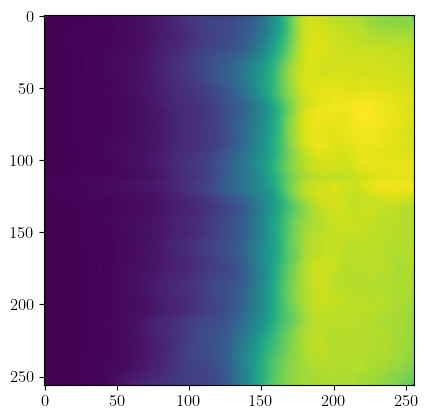

RD.1.2.246.352.71.7.593947511628.1456478.20220726133410.dcm
(256, 256)
53614013331


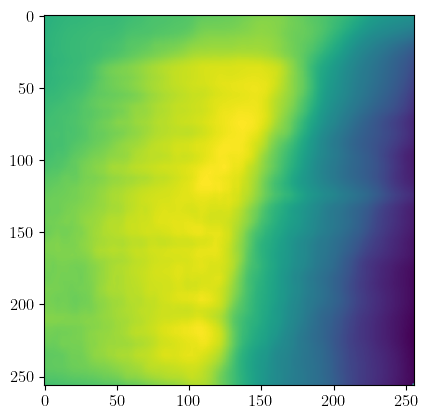

RD.1.2.246.352.71.7.593947511628.1456488.20220726133500.dcm
(256, 256)
23232076298


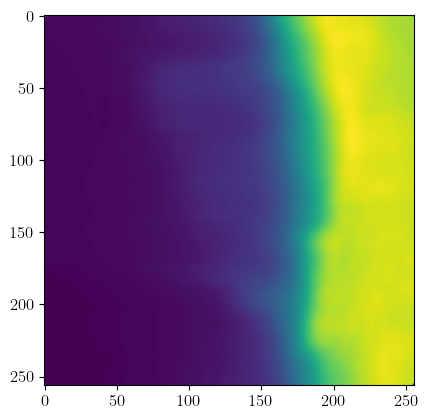

In [89]:
import pydicom as dicom
import matplotlib.pyplot as plt
import os

# specify your image path
folder_path = os.path.join('media', 'Juliana')

# go through all the dicom files in the folder
for filenameDCM in os.listdir(folder_path):

    print(filenameDCM)

    ds = dicom.dcmread(os.path.join(folder_path, filenameDCM))

    ds_clean = ds.copy()
    ds_clean.pixel_array[ds.pixel_array == 2147483647] = 0

    promedio = ds_clean.pixel_array.mean()
    # search the positions in the matrix where the pixel value es 2147483647     
    #print(ds.pixel_array == 2147483647)
    # send those values to 0
    ds.pixel_array[ds.pixel_array == 2147483647] = promedio

    print(ds.pixel_array.shape)
    print(np.sum(ds.pixel_array))

    plt.imshow(ds.pixel_array)
    plt.show()

# 2.1 Juliana 2 

In [90]:
import numpy as np

Piramide102mm.dcm
0
(512, 512)
114128372444


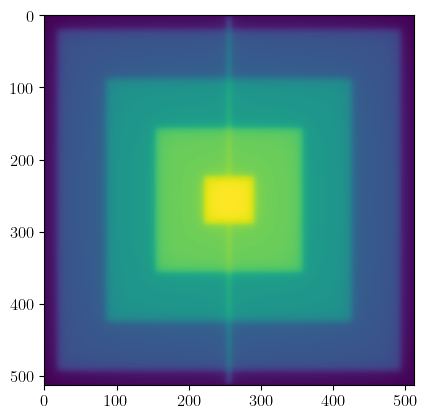

Piramide2laminas.dcm
0
(512, 512)
109929854992


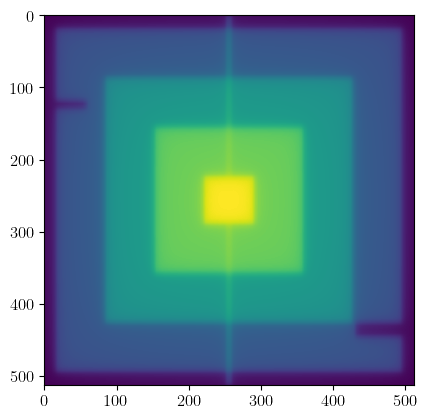

Piramide4laminas.dcm
0
(512, 512)
109462385148


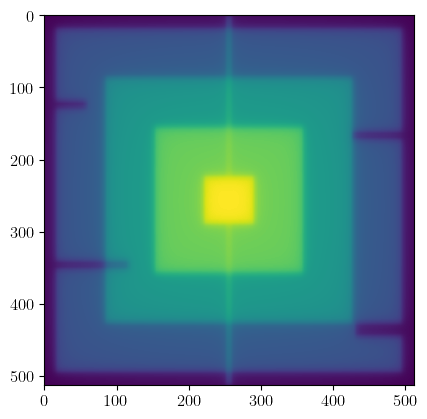

Piramide6laminas.dcm
0
(512, 512)
108603549139


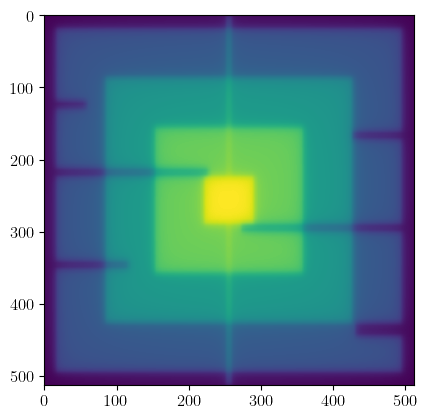

PiramieGamma.dcm
0
(512, 512)
110350466399


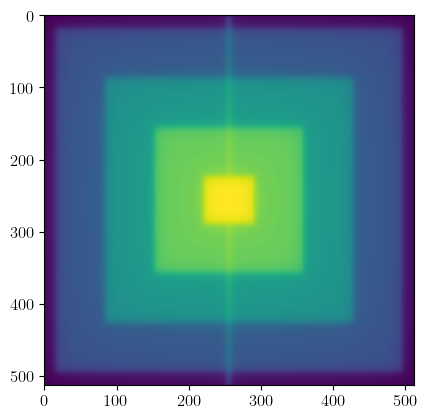

RD.1.2.246.352.71.7.593947511628.1264797.20201027093239.dcm
6
(256, 256)
83057752478


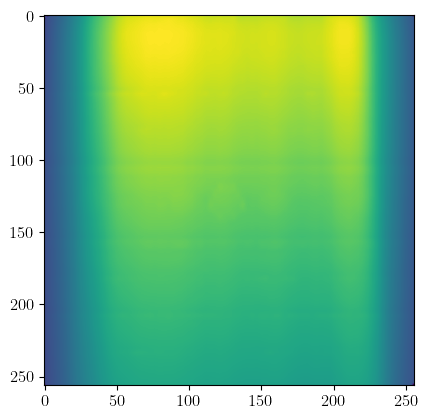

RD.1.2.246.352.71.7.593947511628.1264811.20201027093023.dcm
6
(256, 256)
49017713587


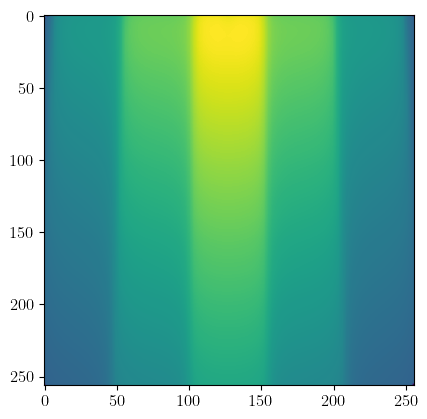

RD.1.2.246.352.71.7.593947511628.1265510.20201029124418.dcm
0
(512, 512)
69097287245


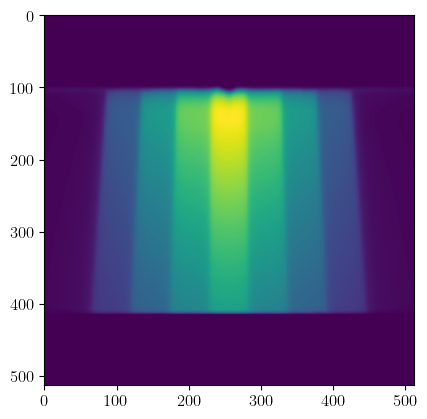

RD.1.2.246.352.71.7.593947511628.1265684.20201029130910.dcm
0
(512, 512)
64711058880


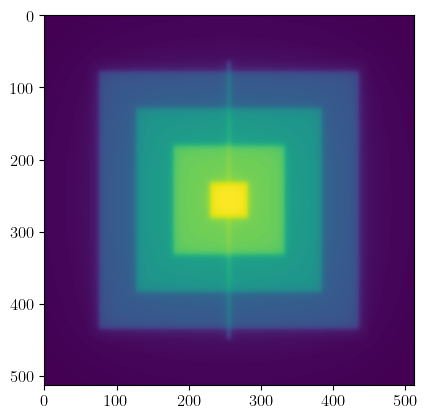

RD.1.2.246.352.71.7.593947511628.1265764.20201029164239.dcm
0
(256, 256)
29221048558


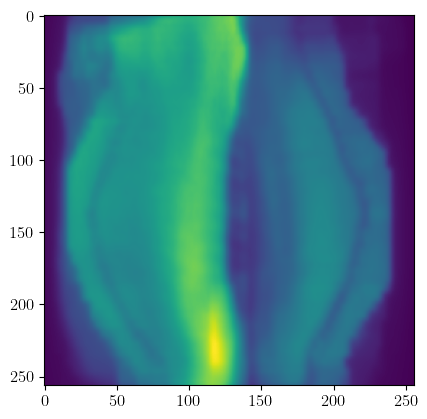

RD.1.2.246.352.71.7.593947511628.1265765.20201029164313.dcm
0
(512, 512)
114695215447


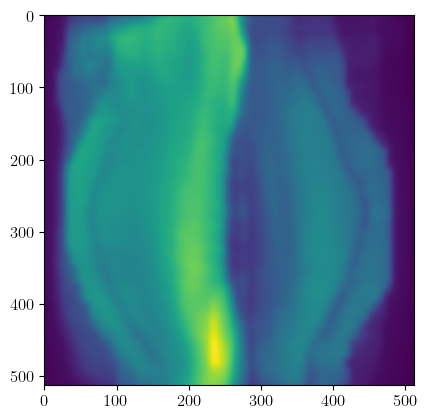

In [91]:
import pydicom as dicom
import matplotlib.pyplot as plt
import os

# specify your image path
folder_path = os.path.join('media', 'Juliana 2')

# go through all the dicom files in the folder
for filenameDCM in os.listdir(folder_path):

    print(filenameDCM)

    ds = dicom.dcmread(os.path.join(folder_path, filenameDCM))

    # search the positions in the matrix where the pixel value es 2147483647     
    print(np.sum(ds.pixel_array == 2147483647))
    # send those values to 0
    ds.pixel_array[ds.pixel_array == 2147483647] = 0
    print(ds.pixel_array.shape)
    print(np.sum(ds.pixel_array))
    plt.imshow(ds.pixel_array)
    plt.show()


# 2.2.1 Caso mama interés

(512, 512)
1135626
17665


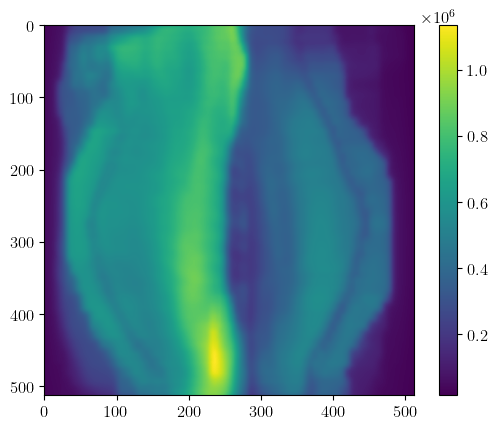

In [92]:
import pydicom as dicom
import matplotlib.pyplot as plt
import os

# specify your image path
folder_path = os.path.join('media', 'Juliana 2')

# go through all the dicom files in the folder
filenameDCM = os.path.join(folder_path, 'RD.1.2.246.352.71.7.593947511628.1265765.20201029164313.dcm')
#filenameDCM = os.path.join(folder_path, 'RD.1.2.246.352.71.7.593947511628.1265764.20201029164239.dcm')

ds = dicom.dcmread(filenameDCM)

# search the positions in the matrix where the pixel value es 2147483647     
#print(np.sum(ds.pixel_array == 2147483647))
# send those values to 0
#ds.pixel_array[ds.pixel_array == 2147483647] = 0
print(ds.pixel_array.shape)
print(np.max(ds.pixel_array))
print(np.min(ds.pixel_array))
#print(np.sum(ds.pixel_array))
plt.imshow(ds.pixel_array)
plt.colorbar()
plt.show()

In [93]:
for key, value in ds.__dict__.items():
    print(f"{key}: {value}")
print()
print(ds)

_parent_encoding: iso8859
_dict: {(0008, 0012): RawDataElement(tag=(0008, 0012), VR=None, length=8, value=b'20201029', value_tell=318, is_implicit_VR=True, is_little_endian=True, is_raw=True), (0008, 0013): RawDataElement(tag=(0008, 0013), VR=None, length=14, value=b'164313.055000 ', value_tell=334, is_implicit_VR=True, is_little_endian=True, is_raw=True), (0008, 0016): RawDataElement(tag=(0008, 0016), VR=None, length=30, value=b'1.2.840.10008.5.1.4.1.1.481.2\x00', value_tell=356, is_implicit_VR=True, is_little_endian=True, is_raw=True), (0008, 0018): RawDataElement(tag=(0008, 0018), VR=None, length=52, value=b'1.2.246.352.71.7.593947511628.1265765.20201029164313', value_tell=394, is_implicit_VR=True, is_little_endian=True, is_raw=True), (0008, 0020): RawDataElement(tag=(0008, 0020), VR=None, length=8, value=b'20201027', value_tell=454, is_implicit_VR=True, is_little_endian=True, is_raw=True), (0008, 0030): RawDataElement(tag=(0008, 0030), VR=None, length=14, value=b'101628.617000 ', v

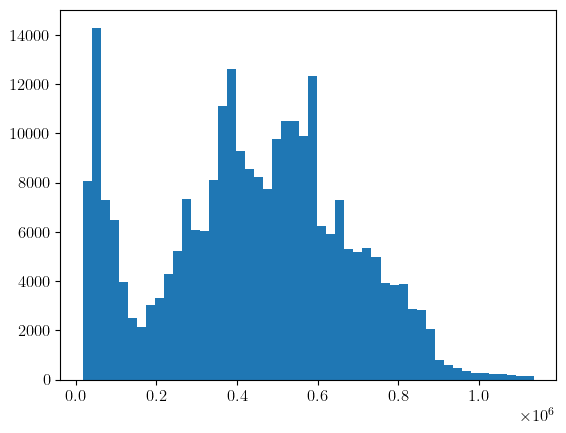

In [94]:
plt.hist(ds.pixel_array.flatten(), bins=50)
plt.show()

## Usando ds.DoseGridScaling

In [95]:
ds.DoseGridScaling

'5.0980392e-06'

In [96]:
a = ds.pixel_array * ds.DoseGridScaling

In [97]:
print(a.min(), a.max())

0.090056862468 5.7894658645392


In [98]:
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Computer Modern Roman']
plt.rcParams['text.usetex'] = True
plt.rcParams.update({'font.size': 14})

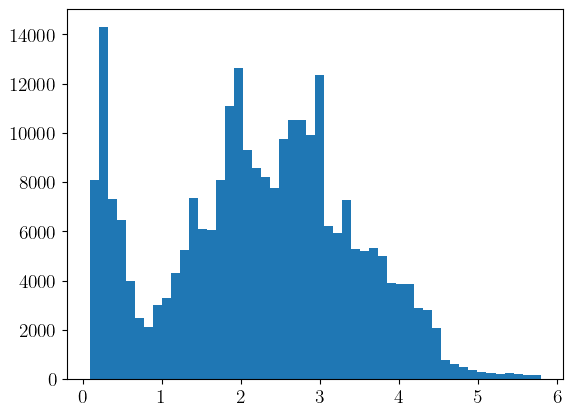

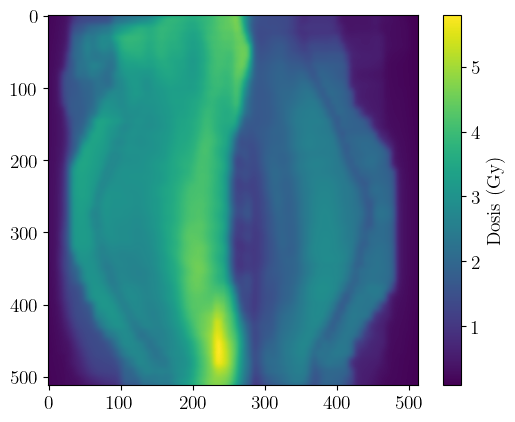

In [99]:
plt.hist(a.flatten(), bins=50)
plt.show()

plt.imshow(a)
plt.colorbar(label='Dosis (Gy)')
#plt.imshow(ds.pixel_array)
plt.show()

In [100]:
from calibration import image_processing 

In [101]:
a_rotated = image_processing.rotate_image(a, 90)

a_rotated_reflected = image_processing.reflect_image(a_rotated, mode='horizontal')

In [102]:
plt.rcParams.update({'font.size': 12})

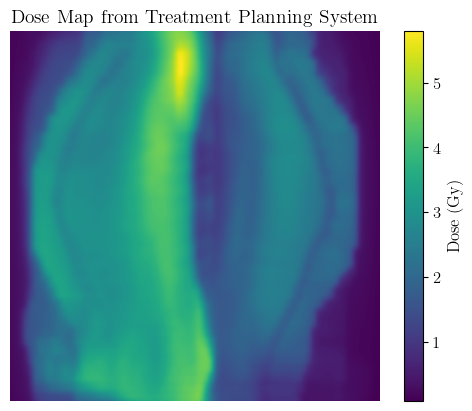

In [103]:
plt.imshow(a_rotated_reflected)
plt.title('Dose Map from Treatment Planning System', fontsize=14)
plt.colorbar(label='Dose (Gy)')
# set off axis
plt.axis('off')
#plt.imshow(ds.pixel_array)
plt.show()

# 3. Check Contreras' files

Mapa de dosis-loloolloolol.dcm
(800, 1003)


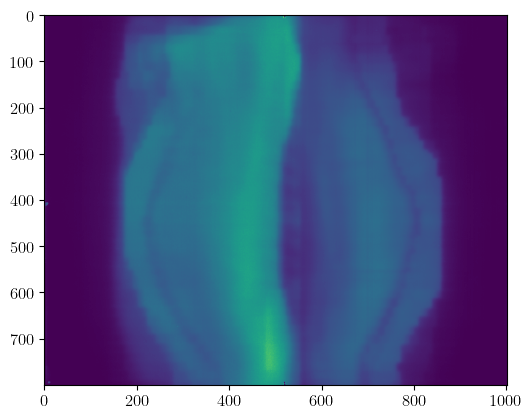

Mapa de dosis-mama-prueba1.dcm
(800, 1003)


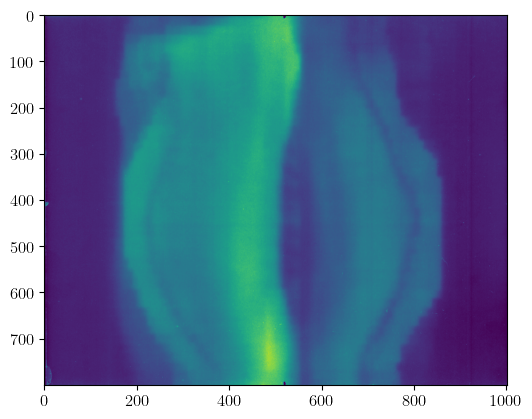

Mapa de dosis-mama2.dcm
(803, 1003)


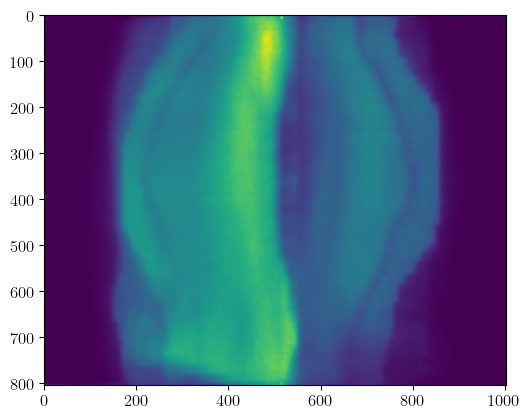

MapaDosisCCC.dcm
(800, 1003)


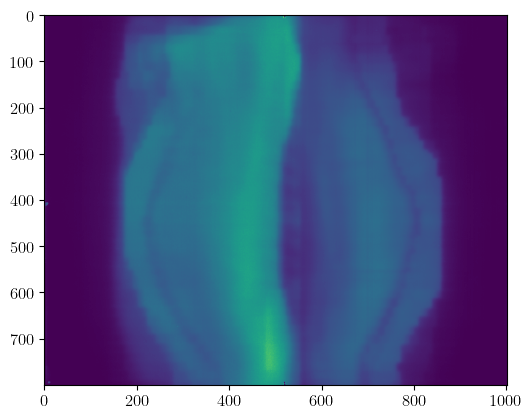

MapaMama.dcm
(800, 1003)


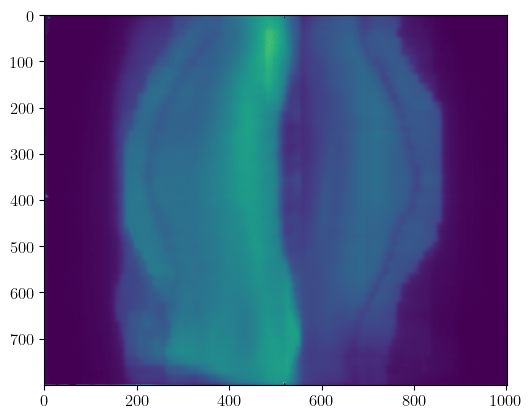

MapaMamaCentro.dcm
(800, 1003)


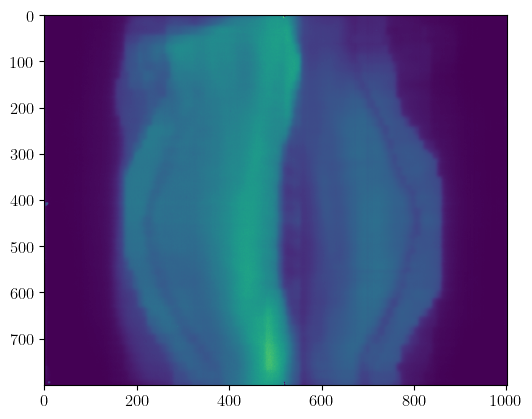

MapaMamaVolteado.dcm
(800, 1003)


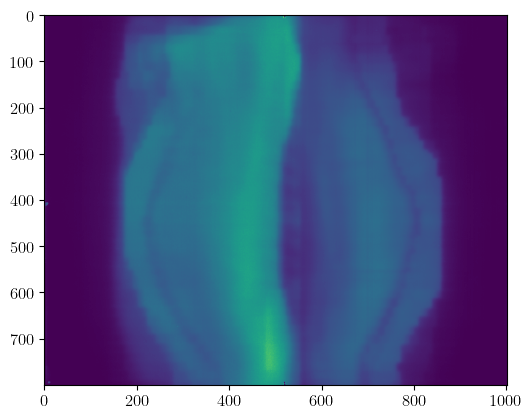

MapaMapaonCentro.dcm
(800, 1003)


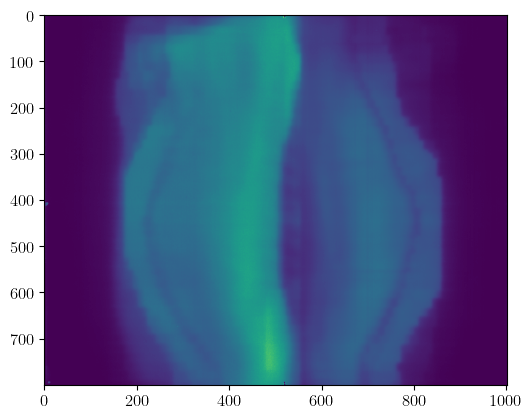

piramide.dcm
(512, 512)


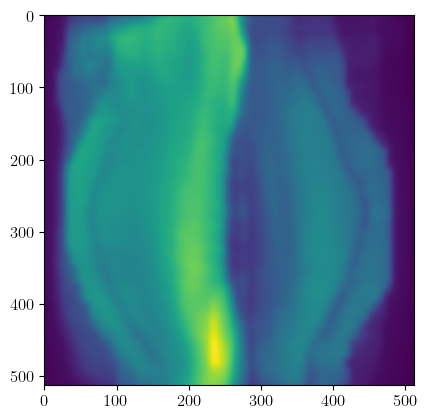

In [104]:
import pydicom as dicom
import matplotlib.pyplot as plt
import os

# specify your image path
base_folder_path = os.path.join('media', 'Contreras clasificado')
folder_path = os.path.join(base_folder_path, 'mama')

# go through all the dicom files in the folder
for filenameDCM in os.listdir(folder_path):
    print(filenameDCM)
    ds = dicom.dcmread(os.path.join(folder_path, filenameDCM))
    print(ds.pixel_array.shape)
    plt.imshow(ds.pixel_array)
    plt.show()

# Gamma

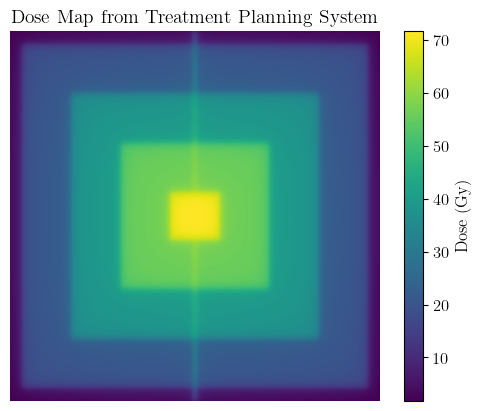

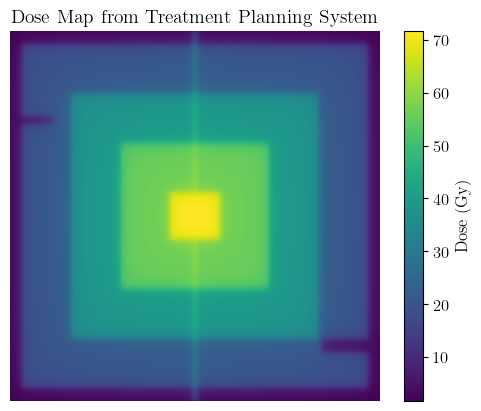

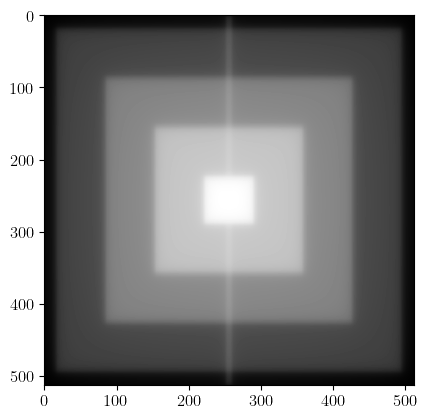

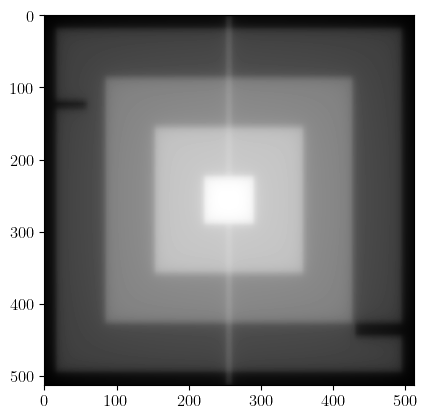

El porentaje de aprovacion es 0.9826842675751006
(258320,)
0.9826842675751006


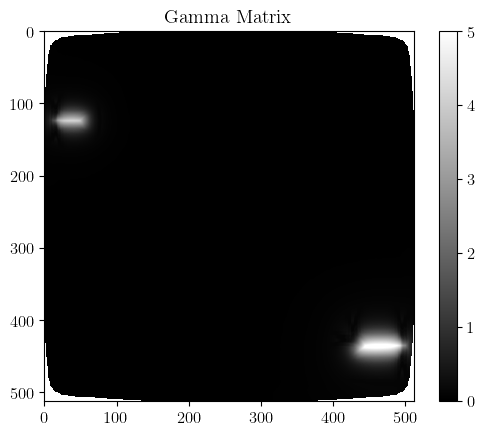

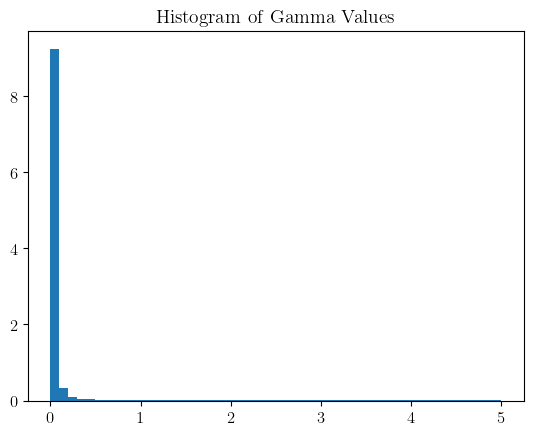

In [117]:
from pydicom import dcmread
import pydicom
import numpy as np
import pymedphys
import matplotlib as mpl
import matplotlib.pyplot as plt


folder_path = os.path.join('media', 'Juliana 2')

ds1 = dcmread(os.path.join(folder_path, 'PiramieGamma.dcm'))
ds2 = dcmread(os.path.join(folder_path, 'Piramide2laminas.dcm'))


plt.imshow(ds1.pixel_array*ds1.DoseGridScaling)
plt.title('Dose Map from Treatment Planning System', fontsize=14)
plt.colorbar(label='Dose (Gy)')
# set off axis
plt.axis('off')
#plt.imshow(ds.pixel_array)
plt.show()

plt.imshow(ds2.pixel_array*ds2.DoseGridScaling)
plt.title('Dose Map from Treatment Planning System', fontsize=14)
plt.colorbar(label='Dose (Gy)')
# set off axis
plt.axis('off')
#plt.imshow(ds.pixel_array)
plt.show()


#ds1=dcmread('/home/carlos/Escritorio/Piramide_2.0/PiramideGamma.dcm')
#ds2=dcmread('/home/carlos/Escritorio/Piramide_2.0/Piramide2laminas.dcm')
#print(ds1)
#print(ds2)

reference = ds1.pixel_array/np.max(ds1.pixel_array)
evaluation = ds2.pixel_array/np.max(ds2.pixel_array)



plt.imshow(reference,cmap=plt.cm.gray)
plt.figure()
plt.imshow(evaluation,cmap=plt.cm.gray)
plt.show()

#reference=reference/26.334
#evaluation=evaluation/26.334
#print(evaluation.shape)
#print(reference.shape)



x1=np.linspace(0,512*ds1.PixelSpacing[0],512)
y1=np.linspace(0,512*ds1.PixelSpacing[1],512)

x2=np.linspace(0,512*ds2.PixelSpacing[0],512)
y2=np.linspace(0,512*ds2.PixelSpacing[1],512)


"""
x1=np.linspace(0,300,768)
y1=np.linspace(0,400,1024)

x2=np.linspace(0,300,768)
y2=np.linspace(0,400,1024)
"""

ejes1=(x1,y1)
ejes2=(x2,y2)

dd=1
mm=1

    


gamma_options = {
    'dose_percent_threshold': dd,
    'distance_mm_threshold': mm,
    'lower_percent_dose_cutoff':5,
    'interp_fraction':10,  # Should be 10 or more for more accurate results
    'max_gamma': 5,
    'random_subset': None,
    'local_gamma': False,
    'ram_available': 5*(2**29)  # 1/2 GB
}

gamma = pymedphys.gamma(
    ejes1, reference,
    ejes2, evaluation,
    **gamma_options)
    

plt.imshow(gamma,cmap=plt.cm.gray)
plt.title('Gamma Matrix', fontsize=14)
plt.colorbar()
valid_gamma = gamma[~np.isnan(gamma)]
pass_ratio = np.sum(valid_gamma <= 1) / len(valid_gamma)
print("El porentaje de aprovacion es",pass_ratio)

valid_gamma = gamma[~np.isnan(gamma)]
print(valid_gamma.shape)

plt.figure()
  
valid_gamma = gamma[~np.isnan(gamma)]
num_bins = (gamma_options['interp_fraction'] * gamma_options['max_gamma'])
bins = np.linspace(0, gamma_options['max_gamma'], num_bins + 1)
plt.hist(valid_gamma, bins, density=True)
plt.title('Histogram of Gamma Values', fontsize=14)
#plt.set_xlim([0, gamma_options['max_gamma']])
pass_ratio = np.sum(valid_gamma <= 1) / len(valid_gamma)
print(pass_ratio)
plt.show()


In [106]:
!pip install pylibjpeg pylibjpeg-libjpeg pylibjpeg-openjpeg

You should consider upgrading via the 'C:\Users\eduar\OneDrive - Universidad de los Andes\2025-10\Tesis Física\FilmQADose rama alternativa\FilmQADose\venv39\Scripts\python.exe -m pip install --upgrade pip' command.


In [107]:
!pip install interpolation

You should consider upgrading via the 'C:\Users\eduar\OneDrive - Universidad de los Andes\2025-10\Tesis Física\FilmQADose rama alternativa\FilmQADose\venv39\Scripts\python.exe -m pip install --upgrade pip' command.


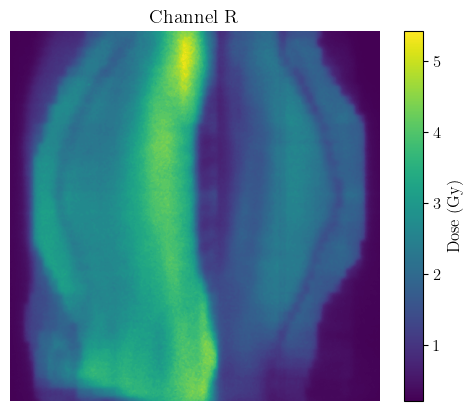

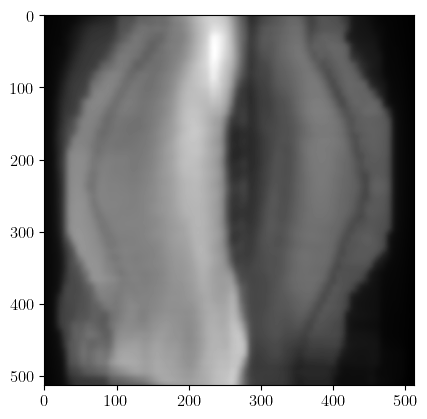

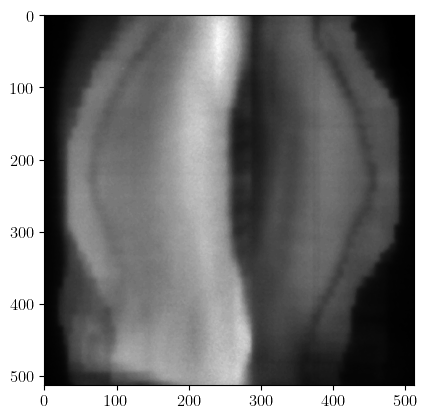

El porentaje de aprovacion es 0.3484531324685599
(242684,)
0.3484531324685599


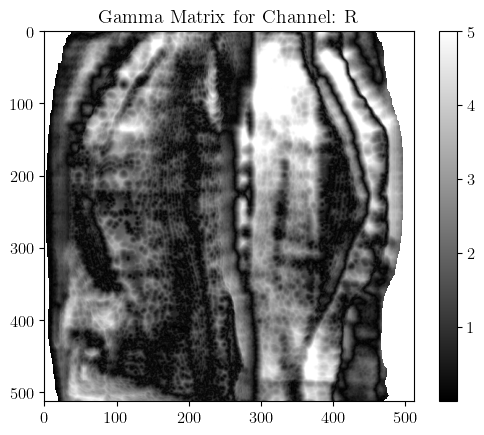

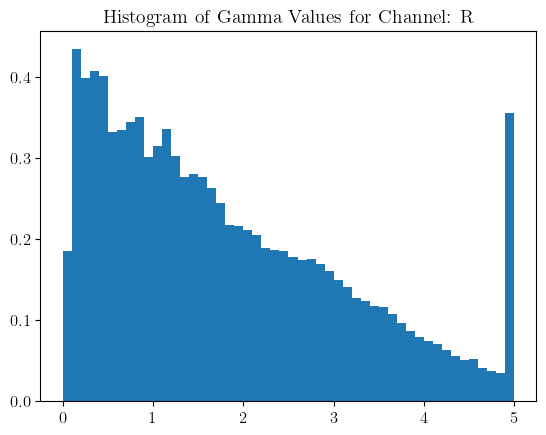

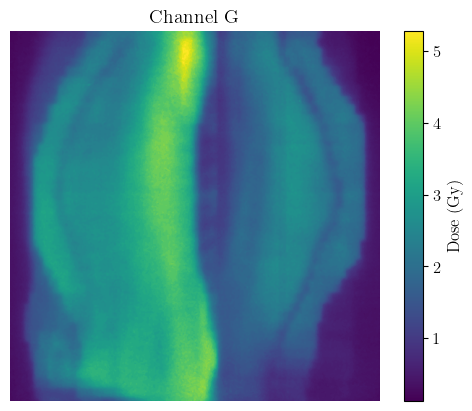

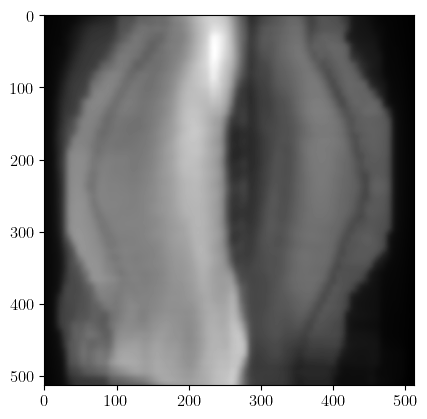

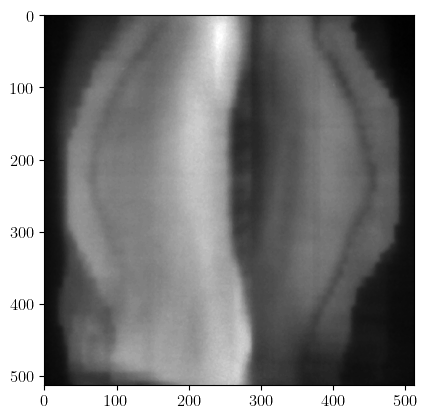

El porentaje de aprovacion es 0.48535956222907156
(242684,)
0.48535956222907156


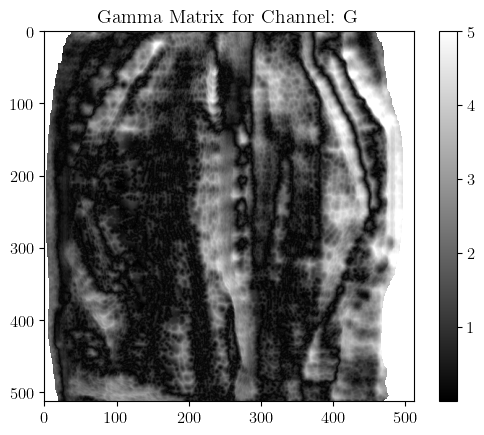

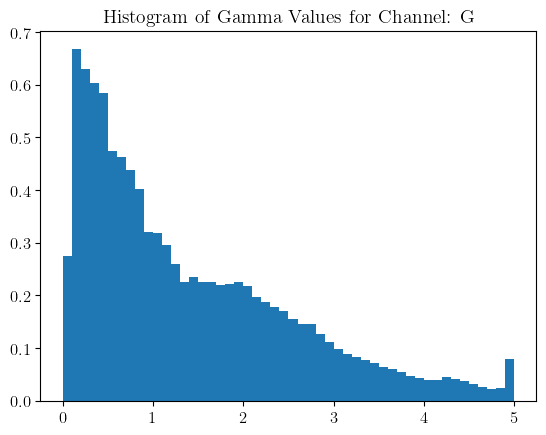

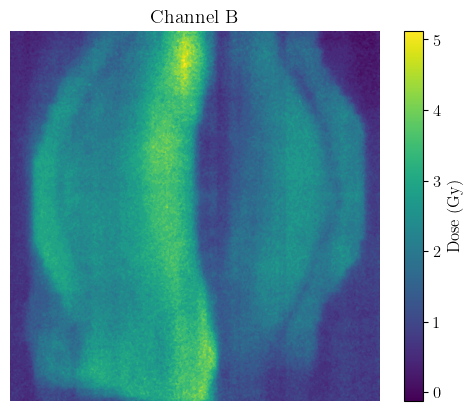

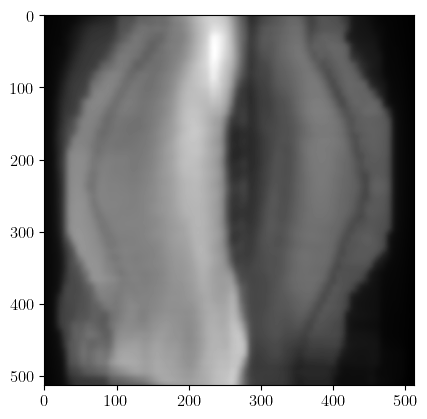

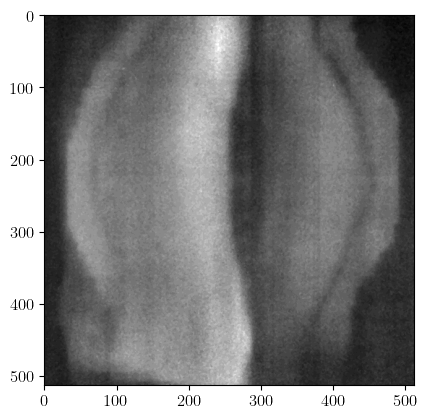

El porentaje de aprovacion es 0.46576618153648364
(242684,)
0.46576618153648364


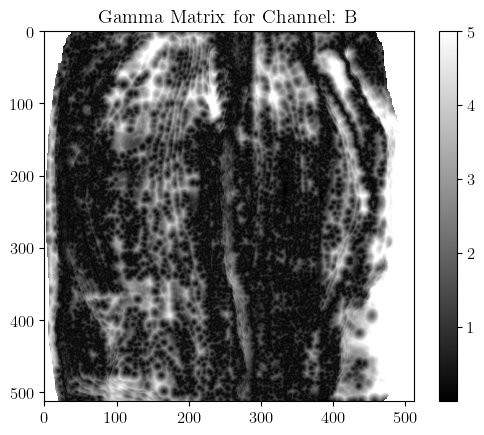

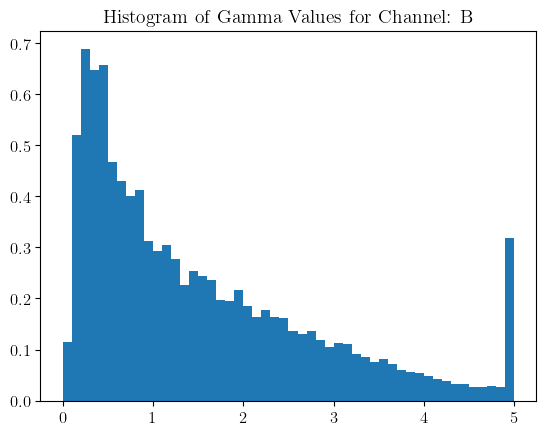

In [120]:
channel = ['R', 'G', 'B']

for i in range(3):

    dose_map = np.load(f'dose_map_channel_{i}.npy')

    ds1 = dcmread(os.path.join(folder_path, 'RD.1.2.246.352.71.7.593947511628.1265765.20201029164313.dcm'))

    #a_rotated_reflected
    plt.imshow(dose_map)
    plt.title(f'Channel {channel[i]}', fontsize=14)
    plt.colorbar(label='Dose (Gy)')
    # set off axis
    plt.axis('off')
    #plt.imshow(ds.pixel_array)
    plt.show()
    #ds1=dcmread('/home/carlos/Escritorio/Piramide_2.0/PiramideGamma.dcm')
    #ds2=dcmread('/home/carlos/Escritorio/Piramide_2.0/Piramide2laminas.dcm')
    #print(ds1)
    #print(ds2)

    reference = a_rotated_reflected/np.max(a_rotated_reflected)
    evaluation = dose_map/np.max(dose_map)

    plt.imshow(reference,cmap=plt.cm.gray)
    plt.figure()
    plt.imshow(evaluation,cmap=plt.cm.gray)
    plt.show()

    #reference=reference/26.334
    #evaluation=evaluation/26.334
    #print(evaluation.shape)
    #print(reference.shape)



    x1=np.linspace(0,512*ds1.PixelSpacing[0],512)
    y1=np.linspace(0,512*ds1.PixelSpacing[1],512)

    x2=np.linspace(0,512*ds1.PixelSpacing[0],512)
    y2=np.linspace(0,512*ds1.PixelSpacing[1],512)


    """
    x1=np.linspace(0,300,768)
    y1=np.linspace(0,400,1024)

    x2=np.linspace(0,300,768)
    y2=np.linspace(0,400,1024)
    """

    ejes1=(x1,y1)
    ejes2=(x2,y2)

    dd=1
    mm=1

        


    gamma_options = {
        'dose_percent_threshold': dd,
        'distance_mm_threshold': mm,
        'lower_percent_dose_cutoff':5,
        'interp_fraction':10,  # Should be 10 or more for more accurate results
        'max_gamma': 5,
        'random_subset': None,
        'local_gamma': False,
        'ram_available': 5*(2**29)  # 1/2 GB
    }

    gamma = pymedphys.gamma(
        ejes1, reference,
        ejes2, evaluation,
        **gamma_options)
        


    plt.imshow(gamma,cmap=plt.cm.gray)
    plt.title(f'Gamma Matrix for Channel: {channel[i]}', fontsize=14)
    plt.colorbar()
    valid_gamma = gamma[~np.isnan(gamma)]
    pass_ratio = np.sum(valid_gamma <= 1) / len(valid_gamma)
    print("El porentaje de aprovacion es",pass_ratio)

    valid_gamma = gamma[~np.isnan(gamma)]
    print(valid_gamma.shape)

    plt.figure()
    
    valid_gamma = gamma[~np.isnan(gamma)]
    num_bins = (gamma_options['interp_fraction'] * gamma_options['max_gamma'])
    bins = np.linspace(0, gamma_options['max_gamma'], num_bins + 1)
    plt.hist(valid_gamma, bins, density=True)
    plt.title(f'Histogram of Gamma Values for Channel: {channel[i]}', fontsize=14)

    #plt.set_xlim([0, gamma_options['max_gamma']])
    pass_ratio = np.sum(valid_gamma <= 1) / len(valid_gamma)
    print(pass_ratio)
    plt.show()
